In [ ]:
%pip -q install ultralytics kagglehub scikit-learn opencv-python pillow matplotlib --upgrade

   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 1.1/1.1 MB 20.9 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 9.5/9.5 MB 53.5 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 8.7/8.7 MB 48.8 MB/s eta 0:00:00


In [ ]:
import os
import cv2
import random
import shutil
from sklearn.model_selection import train_test_split
import numpy as np
import matplotlib.pyplot as plt
from ultralytics import YOLO
import kagglehub

IN_COLAB = os.path.exists('/content')
IN_KAGGLE = os.path.exists('/kaggle')

work_dir = '/content/visdrone_yolo' if IN_COLAB else '/kaggle/working/visdrone_yolo'
os.makedirs(work_dir, exist_ok=True)
print('work_dir:', work_dir)


Creating new Ultralytics Settings v0.0.6 file ✅ 
View Ultralytics Settings with 'yolo settings' or at '/root/.config/Ultralytics/settings.json'
Update Settings with 'yolo settings key=value', i.e. 'yolo settings runs_dir=path/to/dir'. For help see https://docs.ultralytics.com/quickstart/#ultralytics-settings.
work_dir: /content/visdrone_yolo


In [ ]:
path = kagglehub.dataset_download("kushagrapandya/visdrone-dataset")
print("Path to dataset files:", path)

train_base = os.path.join(path, 'VisDrone2019-DET-train', 'VisDrone2019-DET-train')
val_base = os.path.join(path, 'VisDrone2019-DET-val', 'VisDrone2019-DET-val')

train_images_dir = os.path.join(train_base, 'images')
train_annotations_dir = os.path.join(train_base, 'annotations')
val_images_dir = os.path.join(val_base, 'images')
val_annotations_dir = os.path.join(val_base, 'annotations')

print('train_images_dir:', train_images_dir)
print('train_annotations_dir:', train_annotations_dir)
print('val_images_dir:', val_images_dir)
print('val_annotations_dir:', val_annotations_dir)

Using Colab cache for faster access to the 'visdrone-dataset' dataset.
Path to dataset files: /kaggle/input/visdrone-dataset
train_images_dir: /kaggle/input/visdrone-dataset/VisDrone2019-DET-train/VisDrone2019-DET-train/images
train_annotations_dir: /kaggle/input/visdrone-dataset/VisDrone2019-DET-train/VisDrone2019-DET-train/annotations
val_images_dir: /kaggle/input/visdrone-dataset/VisDrone2019-DET-val/VisDrone2019-DET-val/images
val_annotations_dir: /kaggle/input/visdrone-dataset/VisDrone2019-DET-val/VisDrone2019-DET-val/annotations


In [ ]:
for subdir in ['images/train', 'images/val', 'labels/train', 'labels/val']:
    os.makedirs(os.path.join(work_dir, subdir), exist_ok=True)

def convert_split(images_dir, annotations_dir, subset):
    out_img_dir = os.path.join(work_dir, 'images', subset)
    out_lbl_dir = os.path.join(work_dir, 'labels', subset)
    for fname in os.listdir(images_dir):
        if not fname.lower().endswith('.jpg'):
            continue
        img_path = os.path.join(images_dir, fname)
        ann_path = os.path.join(annotations_dir, fname.replace('.jpg', '.txt'))
        out_img = os.path.join(out_img_dir, fname)
        out_lbl = os.path.join(out_lbl_dir, fname.replace('.jpg', '.txt'))

        img = cv2.imread(img_path)
        if img is None:
            continue
        h, w = img.shape[:2]

        with open(out_lbl, 'w') as f_out:
            if os.path.exists(ann_path):
                with open(ann_path, 'r') as f_in:
                    for line in f_in:
                        vals = line.strip().split(',')
                        if len(vals) != 8:
                            continue
                        try:
                            x, y, bw, bh, score, category, trunc, occ = map(int, vals)
                        except ValueError:
                            continue
                        if category in (1, 2): 
                            cx = x + bw / 2
                            cy = y + bh / 2
                            f_out.write(f"0 {cx/w} {cy/h} {bw/w} {bh/h}\n")
        shutil.copyfile(img_path, out_img)

convert_split(train_images_dir, train_annotations_dir, 'train')
convert_split(val_images_dir, val_annotations_dir, 'val')

print('VisDrone successfully converted to YOLO format (kagglehub)!')


VisDrone successfully converted to YOLO format (kagglehub)!


In [ ]:
import yaml

dataset_yaml = {
    'path': work_dir,
    'train': 'images/train',
    'val': 'images/val',
    'names': {0: 'human'}
}

yaml_path = os.path.join(work_dir, 'visdrone.yaml')
with open(yaml_path, 'w') as f:
    yaml.safe_dump(dataset_yaml, f, sort_keys=False)

print('Dataset YAML created at:', yaml_path)

Dataset YAML created at: /content/visdrone_yolo/visdrone.yaml


In [ ]:
model = YOLO('yolo11s.pt')

SAVE_DIR = None
train_result = model.train(
    data=yaml_path,
    epochs=45,
    imgsz=900,
    batch=8,
    workers=2,        
    lr0=0.004,
    lrf=0.01,
    momentum=0.937,
    weight_decay=0.0005,
    warmup_epochs=3,
    augment=True,
    cos_lr=True,
    close_mosaic=10,
    patience=50,
    pretrained=True,
)
SAVE_DIR = str(train_result.save_dir)
print('Training complete. SAVE_DIR=', SAVE_DIR)


Ultralytics 8.3.206 🚀 Python-3.12.11 torch-2.8.0+cu126 CUDA:0 (Tesla T4, 15095MiB)
engine/trainer: agnostic_nms=False, amp=True, augment=True, auto_augment=randaugment, batch=8, bgr=0.0, box=7.5, cache=False, cfg=None, classes=None, close_mosaic=10, cls=0.5, compile=False, conf=None, copy_paste=0.0, copy_paste_mode=flip, cos_lr=True, cutmix=0.0, data=/content/visdrone_yolo/visdrone.yaml, degrees=0.0, deterministic=True, device=None, dfl=1.5, dnn=False, dropout=0.0, dynamic=False, embed=None, epochs=45, erasing=0.4, exist_ok=False, fliplr=0.5, flipud=0.0, format=torchscript, fraction=1.0, freeze=None, half=False, hsv_h=0.015, hsv_s=0.7, hsv_v=0.4, imgsz=900, int8=False, iou=0.7, keras=False, kobj=1.0, line_width=None, lr0=0.004, lrf=0.01, mask_ratio=4, max_det=300, mixup=0.0, mode=train, model=yolo11s.pt, momentum=0.937, mosaic=1.0, multi_scale=False, name=train, nbs=64, nms=False, opset=None, optimize=False, optimizer=auto, overlap_mask=True, patience=50, perspective=0.0, plots=True, p


image 1/1 /content/visdrone_yolo/images/val/0000103_04948_d_0000035.jpg: 544x928 (no detections), 51.0ms
Speed: 4.3ms preprocess, 51.0ms inference, 0.6ms postprocess per image at shape (1, 3, 544, 928)


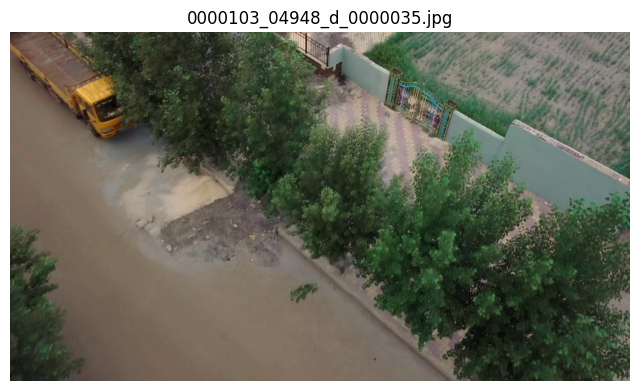


image 1/1 /content/visdrone_yolo/images/val/0000215_00000_d_0000256.jpg: 544x928 19 humans, 18.5ms
Speed: 5.6ms preprocess, 18.5ms inference, 1.7ms postprocess per image at shape (1, 3, 544, 928)


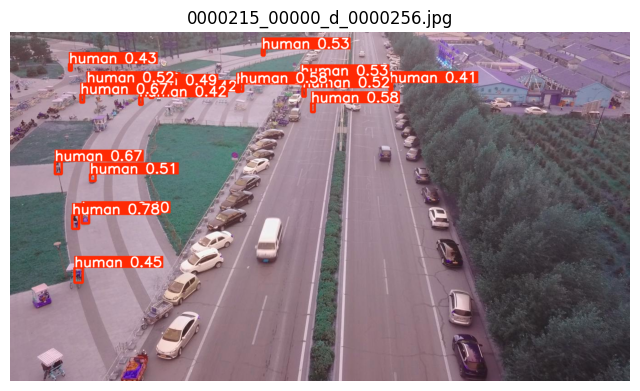


image 1/1 /content/visdrone_yolo/images/val/0000116_01338_d_0000086.jpg: 544x928 13 humans, 18.5ms
Speed: 9.1ms preprocess, 18.5ms inference, 1.5ms postprocess per image at shape (1, 3, 544, 928)


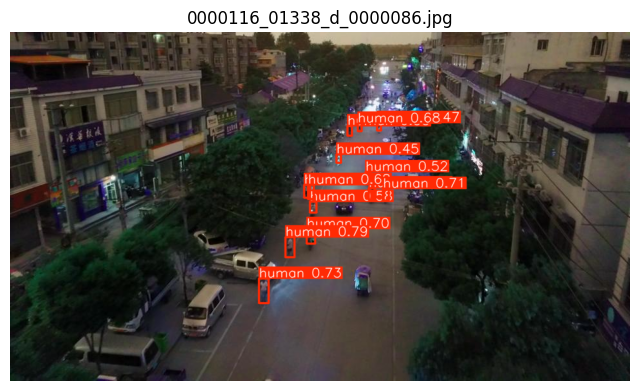


image 1/1 /content/visdrone_yolo/images/val/0000001_07999_d_0000012.jpg: 544x928 35 humans, 18.5ms
Speed: 5.6ms preprocess, 18.5ms inference, 1.7ms postprocess per image at shape (1, 3, 544, 928)


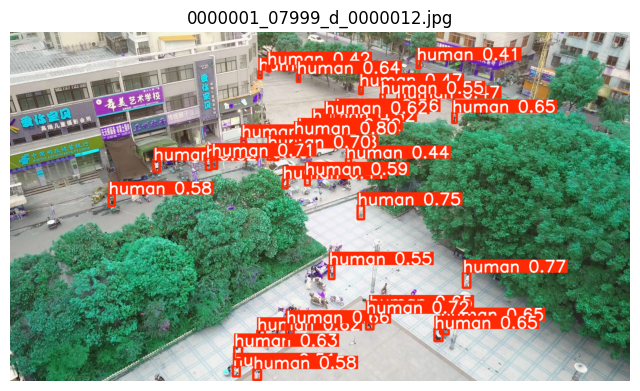


image 1/1 /content/visdrone_yolo/images/val/0000312_02401_d_0000426.jpg: 544x928 14 humans, 18.6ms
Speed: 5.3ms preprocess, 18.6ms inference, 1.6ms postprocess per image at shape (1, 3, 544, 928)


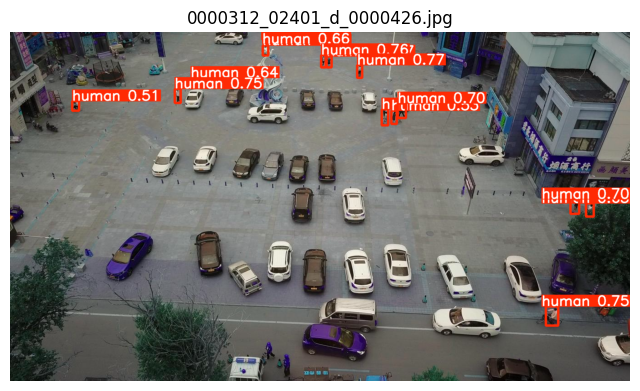


image 1/1 /content/visdrone_yolo/images/val/0000335_00197_d_0000044.jpg: 544x928 10 humans, 18.5ms
Speed: 5.4ms preprocess, 18.5ms inference, 1.6ms postprocess per image at shape (1, 3, 544, 928)


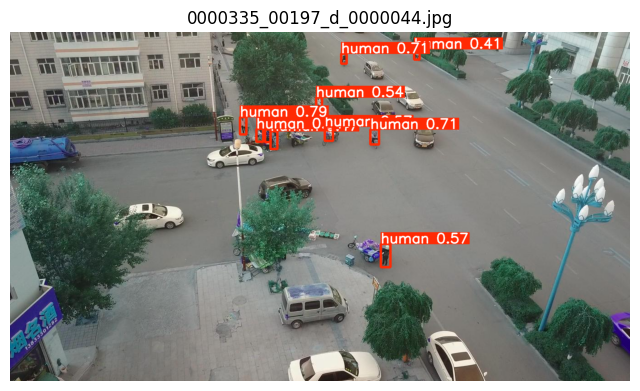


image 1/1 /content/visdrone_yolo/images/val/0000271_00001_d_0000374.jpg: 544x928 17 humans, 18.5ms
Speed: 5.2ms preprocess, 18.5ms inference, 1.5ms postprocess per image at shape (1, 3, 544, 928)


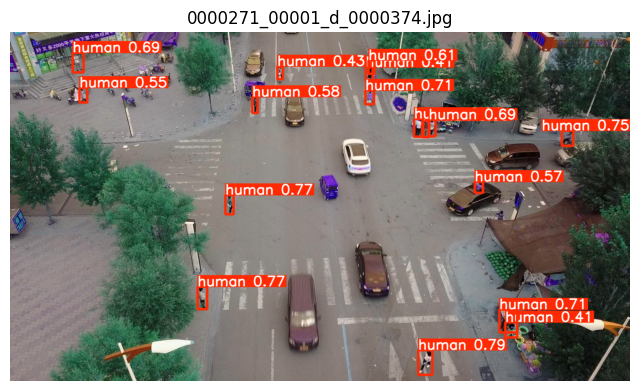


image 1/1 /content/visdrone_yolo/images/val/0000244_00500_d_0000002.jpg: 544x928 2 humans, 18.5ms
Speed: 4.9ms preprocess, 18.5ms inference, 1.7ms postprocess per image at shape (1, 3, 544, 928)


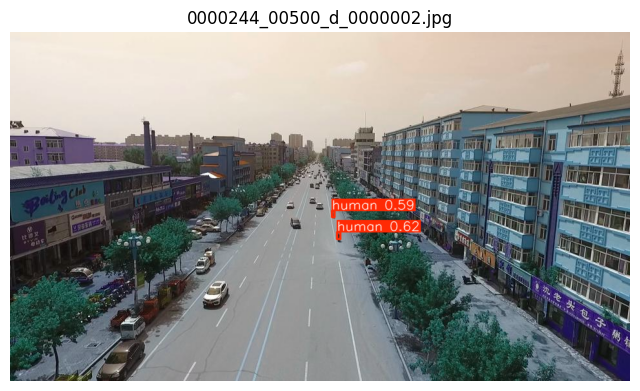


image 1/1 /content/visdrone_yolo/images/val/0000249_01100_d_0000004.jpg: 544x928 1 human, 18.5ms
Speed: 5.9ms preprocess, 18.5ms inference, 1.9ms postprocess per image at shape (1, 3, 544, 928)


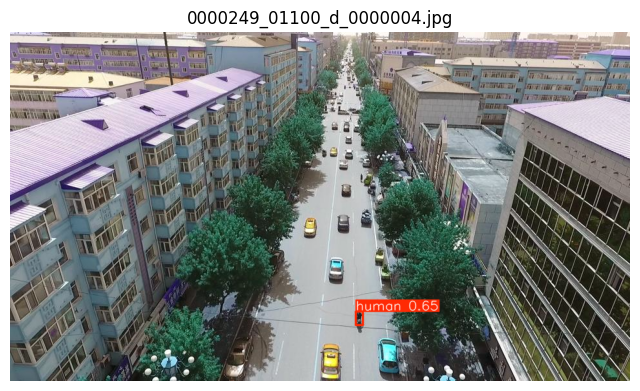


image 1/1 /content/visdrone_yolo/images/val/0000271_02401_d_0000385.jpg: 544x928 13 humans, 18.5ms
Speed: 5.3ms preprocess, 18.5ms inference, 1.5ms postprocess per image at shape (1, 3, 544, 928)


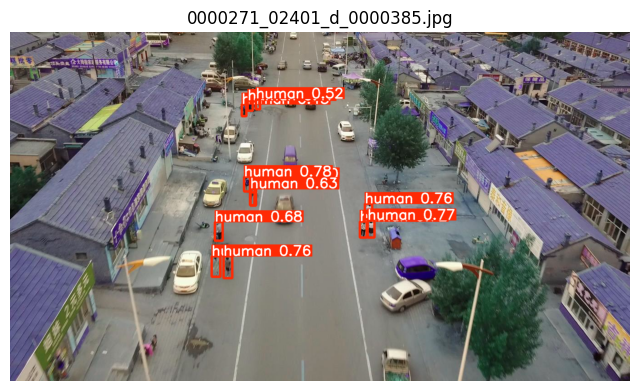


image 1/1 /content/visdrone_yolo/images/val/0000360_06273_d_0000745.jpg: 544x928 8 humans, 18.5ms
Speed: 6.1ms preprocess, 18.5ms inference, 1.8ms postprocess per image at shape (1, 3, 544, 928)


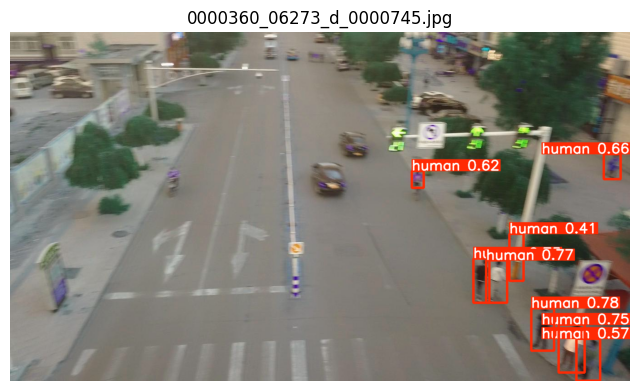


image 1/1 /content/visdrone_yolo/images/val/0000116_00351_d_0000083.jpg: 544x928 18 humans, 18.6ms
Speed: 5.5ms preprocess, 18.6ms inference, 1.6ms postprocess per image at shape (1, 3, 544, 928)


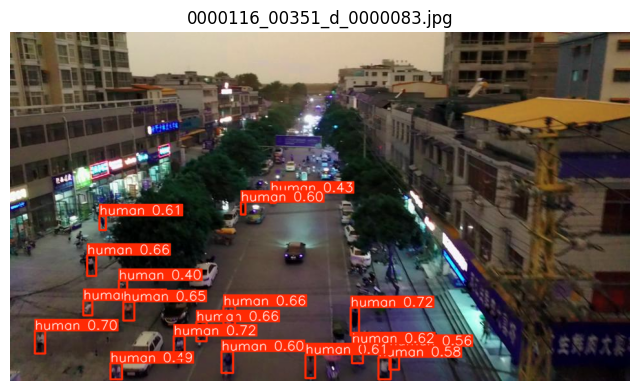

In [ ]:
best_model = YOLO(os.path.join(SAVE_DIR, 'weights', 'best.pt'))

val_dir = os.path.join(work_dir, 'images', 'val')
val_images = [f for f in os.listdir(val_dir) if f.lower().endswith('.jpg')]

sample_images = random.sample(val_images, min(12, len(val_images)))
for img_file in sample_images:
    img_path = os.path.join(val_dir, img_file)
    results = best_model.predict(source=img_path, conf=0.4, save=False)
    res_plotted = results[0].plot()
    plt.figure(figsize=(8, 8))
    plt.imshow(res_plotted)
    plt.axis('off')
    plt.title(img_file)
    plt.show()


In [ ]:
import pandas as pd
import seaborn as sns
from pathlib import Path
from collections import defaultdict, deque
import json
from datetime import datetime
import warnings
warnings.filterwarnings('ignore')

import torch
import torch.nn as nn
import torch.nn.functional as F
from torch.utils.data import Dataset, DataLoader
import networkx as nx

try:
    from torch_geometric.nn import GCNConv, GATConv
    from torch_geometric.data import Data
except ImportError:
    print("torch-geometric not fully installed. Using basic graph operations.")

print("✓ All imports successful!")


torch-geometric not fully installed. Using basic graph operations.
✓ All imports successful!


In [ ]:
class QuadTreeNode:
    def __init__(self, x, y, width, height, depth=0, max_depth=6):
        self.x = x
        self.y = y
        self.width = width
        self.height = height
        self.depth = depth
        self.max_depth = max_depth
        self.crowd_count = 0
        self.density = 0.0
        self.children = []
        self.is_leaf = True

    def subdivide(self):
        if self.depth >= self.max_depth:
            return
        hw, hh = self.width / 2, self.height / 2
        self.children = [
            QuadTreeNode(self.x, self.y, hw, hh, self.depth + 1, self.max_depth),
            QuadTreeNode(self.x + hw, self.y, hw, hh, self.depth + 1, self.max_depth),
            QuadTreeNode(self.x, self.y + hh, hw, hh, self.depth + 1, self.max_depth),
            QuadTreeNode(self.x + hw, self.y + hh, hw, hh, self.depth + 1, self.max_depth),
        ]
        self.is_leaf = False

class QuadTreeDensityEstimator:
    def __init__(self, frame_width, frame_height, max_depth=6, density_threshold=5):
        self.width = frame_width
        self.height = frame_height
        self.max_depth = max_depth
        self.density_threshold = density_threshold
        self.root = None

    def build_tree(self, detections):
        self.root = QuadTreeNode(0, 0, self.width, self.height, 0, self.max_depth)
        self._insert_detections(self.root, detections)
        return self.root

    def _insert_detections(self, node, detections):
        detections_in_node = []
        for det in detections:
            x1, y1, x2, y2 = det['bbox']
            cx = (x1 + x2) / 2
            cy = (y1 + y2) / 2
            if self._point_in_rect(cx, cy, node.x, node.y, node.width, node.height):
                detections_in_node.append(det)
        node.crowd_count = len(detections_in_node)
        area = max(node.width * node.height, 1)
        node.density = node.crowd_count / area * 10000
        if node.crowd_count > self.density_threshold and node.depth < self.max_depth:
            node.subdivide()
            for child in node.children:
                self._insert_detections(child, detections_in_node)

    def _point_in_rect(self, px, py, rx, ry, rw, rh):
        return rx <= px < rx + rw and ry <= py < ry + rh

    def get_density_map(self):
        density_map = np.zeros((self.height, self.width), dtype=np.float32)
        if self.root:
            self._fill_density_map(self.root, density_map)
        return density_map

    def _fill_density_map(self, node, density_map):
        if node.is_leaf:
            x1, y1 = int(node.x), int(node.y)
            x2, y2 = int(node.x + node.width), int(node.y + node.height)
            x2 = min(x2, self.width)
            y2 = min(y2, self.height)
            density_map[y1:y2, x1:x2] = node.density
        else:
            for child in node.children:
                self._fill_density_map(child, density_map)

    def visualize_tree(self, frame):
        vis_frame = frame.copy()
        if self.root:
            self._draw_node(vis_frame, self.root)
        return vis_frame

    def _draw_node(self, frame, node):
        if node.density < 2:
            color = (0, 255, 0)
        elif node.density < 5:
            color = (0, 255, 255)
        else:
            color = (0, 0, 255)
        x1, y1 = int(node.x), int(node.y)
        x2, y2 = int(node.x + node.width), int(node.y + node.height)
        cv2.rectangle(frame, (x1, y1), (x2, y2), color, 2)
        cv2.putText(frame, f"{node.crowd_count}", (x1 + 5, y1 + 20), cv2.FONT_HERSHEY_SIMPLEX, 0.5, color, 2)
        if not node.is_leaf:
            for child in node.children:
                self._draw_node(frame, child)

    def get_hotspots(self, threshold=8):
        hotspots = []
        if self.root:
            self._find_hotspots(self.root, hotspots, threshold)
        return hotspots

    def _find_hotspots(self, node, hotspots, threshold):
        if node.density > threshold:
            hotspots.append({'x': node.x, 'y': node.y, 'width': node.width, 'height': node.height, 'density': node.density, 'count': node.crowd_count})
        if not node.is_leaf:
            for child in node.children:
                self._find_hotspots(child, hotspots, threshold)

print("✓ QuadTree Density Estimator created!")

✓ QuadTree Density Estimator created!


Detected 25 people
Found 5 hotspots


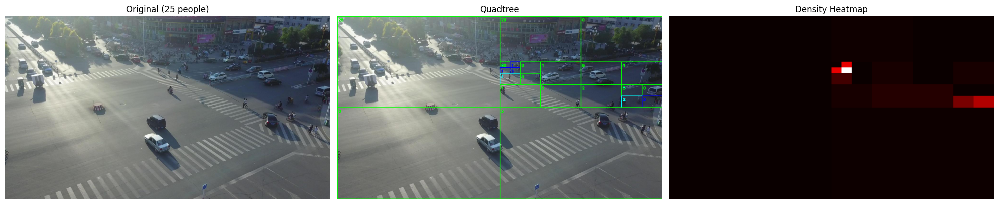


✓ Quadtree visualization complete!


In [ ]:
val_dir = os.path.join(work_dir, 'images', 'val')
assert os.path.isdir(val_dir), 'Validation directory missing. Run conversion cell.'

test_images = [f for f in os.listdir(val_dir) if f.lower().endswith('.jpg')]
sample_path = os.path.join(val_dir, random.choice(test_images))
frame = cv2.imread(sample_path)
frame_rgb = cv2.cvtColor(frame, cv2.COLOR_BGR2RGB)

results = model(frame, conf=0.4, verbose=False)

detections = []
for box in results[0].boxes:
    x1, y1, x2, y2 = map(int, box.xyxy[0])
    detections.append({'bbox': (x1, y1, x2, y2), 'confidence': float(box.conf[0])})

print(f"Detected {len(detections)} people")

h, w = frame.shape[:2]
quadtree = QuadTreeDensityEstimator(w, h, max_depth=5, density_threshold=3)
quadtree.build_tree(detections)

quadtree_vis = quadtree.visualize_tree(frame_rgb)
density_map = quadtree.get_density_map()
hotspots = quadtree.get_hotspots(threshold=5)
print(f"Found {len(hotspots)} hotspots")

fig, axes = plt.subplots(1, 3, figsize=(20, 6))
axes[0].imshow(frame_rgb); axes[0].set_title(f'Original ({len(detections)} people)'); axes[0].axis('off')
axes[1].imshow(quadtree_vis); axes[1].set_title('Quadtree'); axes[1].axis('off')
axes[2].imshow(density_map, cmap='hot'); axes[2].set_title('Density Heatmap'); axes[2].axis('off')
plt.tight_layout(); plt.show()
print("\n✓ Quadtree visualization complete!")


In [ ]:
class CrowdMobilityGraph:
    def __init__(self, frame_width, frame_height, grid_size=100):
        self.width = frame_width
        self.height = frame_height
        self.grid_size = grid_size
        self.grid_x = max(1, frame_width // grid_size)
        self.grid_y = max(1, frame_height // grid_size)
        self.history = deque(maxlen=30)

    def create_graph(self, detections, timestamp=None):
        grid = np.zeros((self.grid_y, self.grid_x), dtype=np.float32)
        for det in detections:
            x1, y1, x2, y2 = det['bbox']
            cx = (x1 + x2) // 2
            cy = (y1 + y2) // 2
            gx = min(cx // self.grid_size, self.grid_x - 1)
            gy = min(cy // self.grid_size, self.grid_y - 1)
            grid[gy, gx] += 1
        nodes, edges, edge_weights = [], [], []
        for gy in range(self.grid_y):
            for gx in range(self.grid_x):
                node_id = gy * self.grid_x + gx
                nodes.append({'id': node_id,'x': gx,'y': gy,'crowd_count': float(grid[gy, gx]),'position': (gx * self.grid_size, gy * self.grid_size),'density': float(grid[gy, gx]) / (self.grid_size * self.grid_size) * 10000})
        for gy in range(self.grid_y):
            for gx in range(self.grid_x):
                node_id = gy * self.grid_x + gx
                neighbors = [(gx + 1, gy), (gx, gy + 1), (gx - 1, gy), (gx, gy - 1), (gx + 1, gy + 1), (gx - 1, gy - 1), (gx + 1, gy - 1), (gx - 1, gy + 1)]
                for nx_, ny_ in neighbors:
                    if 0 <= nx_ < self.grid_x and 0 <= ny_ < self.grid_y:
                        neighbor_id = ny_ * self.grid_x + nx_
                        crowd_diff = abs(grid[gy, gx] - grid[ny_, nx_])
                        weight = 1.0 / (1.0 + crowd_diff)
                        edges.append([node_id, neighbor_id])
                        edge_weights.append(weight)
        graph_data = {'nodes': nodes,'edges': edges,'edge_weights': edge_weights,'grid': grid,'timestamp': timestamp or datetime.now().isoformat()}
        self.history.append(graph_data)
        return graph_data

    def visualize_graph(self, graph_data, frame_shape):
        h, w = frame_shape[:2]
        vis = np.zeros((h, w, 3), dtype=np.uint8)
        for node in graph_data['nodes']:
            x, y = node['position']
            count = node['crowd_count']
            color = (50, 50, 50) if count == 0 else ((0, 255, 0) if count < 3 else ((0, 255, 255) if count < 7 else (0, 0, 255)))
            cv2.rectangle(vis, (x, y),(min(x + self.grid_size, w), min(y + self.grid_size, h)),color, -1)
            if count > 0:
                cv2.putText(vis, f"{int(count)}",(x + 10, y + 30),cv2.FONT_HERSHEY_SIMPLEX, 0.5, (255, 255, 255), 1)
        for edge in graph_data['edges'][:100]:
            n1 = graph_data['nodes'][edge[0]]; n2 = graph_data['nodes'][edge[1]]
            x1, y1 = n1['position']; x2, y2 = n2['position']
            cx1, cy1 = x1 + self.grid_size // 2, y1 + self.grid_size // 2
            cx2, cy2 = x2 + self.grid_size // 2, y2 + self.grid_size // 2
            cv2.line(vis, (cx1, cy1), (cx2, cy2), (128, 128, 128), 1)
        return vis

print("✓ Crowd Mobility Graph (CMGraph) created!")


✓ Crowd Mobility Graph (CMGraph) created!


In [ ]:
class CongestionGNN(nn.Module):
    def __init__(self, node_features=4, hidden_dim=64, output_dim=1, num_layers=3):
        super().__init__()
        self.gnn_layers = nn.ModuleList()
        self.gnn_layers.append(nn.Linear(node_features, hidden_dim))
        for _ in range(num_layers - 1):
            self.gnn_layers.append(nn.Linear(hidden_dim, hidden_dim))
        self.fc1 = nn.Linear(hidden_dim, hidden_dim // 2)
        self.fc2 = nn.Linear(hidden_dim // 2, output_dim)
        self.dropout = nn.Dropout(0.3)
        self.relu = nn.ReLU()

    def graph_convolution(self, x, adj_matrix):
        return torch.mm(adj_matrix, x)

    def forward(self, x, adj_matrix):
        for i, layer in enumerate(self.gnn_layers):
            x = layer(x)
            if i < len(self.gnn_layers) - 1:
                x = self.graph_convolution(x, adj_matrix)
            x = self.relu(x)
            x = self.dropout(x)
        x = self.relu(self.fc1(x))
        x = self.dropout(x)
        x = self.fc2(x)
        return x

class CongestionForecaster:
    def __init__(self, grid_x, grid_y, device='cuda' if torch.cuda.is_available() else 'cpu'):
        self.grid_x = grid_x
        self.grid_y = grid_y
        self.device = device
        self.model = CongestionGNN(node_features=4, hidden_dim=64).to(device)
        self.optimizer = torch.optim.Adam(self.model.parameters(), lr=0.001)
        self.criterion = nn.MSELoss()
        self.training_history = []

    def prepare_graph_data(self, graph_data):
        nodes = graph_data['nodes']
        edges = graph_data['edges']
        x = torch.tensor([[n['x'] / self.grid_x, n['y'] / self.grid_y, n['crowd_count'], n['density'] / 100.0] for n in nodes], dtype=torch.float).to(self.device)
        num_nodes = len(nodes)
        adj_matrix = torch.zeros((num_nodes, num_nodes), dtype=torch.float).to(self.device)
        for edge in edges:
            adj_matrix[edge[0], edge[1]] = 1
            adj_matrix[edge[1], edge[0]] = 1
        adj_matrix = adj_matrix + torch.eye(num_nodes).to(self.device)
        degree = adj_matrix.sum(dim=1, keepdim=True)
        adj_matrix = adj_matrix / degree
        return x, adj_matrix

    def predict(self, graph_data):
        self.model.eval()
        with torch.no_grad():
            x, adj_matrix = self.prepare_graph_data(graph_data)
            pred = self.model(x, adj_matrix)
        return pred.cpu().numpy()

    def visualize_prediction(self, frame, graph_data, prediction):
        h, w = frame.shape[:2]
        vis_frame = frame.copy()
        overlay = np.zeros_like(vis_frame)
        for idx, node in enumerate(graph_data['nodes']):
            pred_crowd = max(0, prediction[idx][0])
            x, y = node['position']
            grid_size = w // self.grid_x
            if pred_crowd > 8:
                color = (0, 0, 255)
            elif pred_crowd > 4:
                color = (0, 255, 255)
            elif pred_crowd > 0:
                color = (0, 255, 0)
            else:
                continue
            cv2.rectangle(overlay, (x, y),(min(x + grid_size, w), min(y + grid_size, h)),color, -1)
            if pred_crowd > 2:
                cv2.putText(overlay, f"{pred_crowd:.1f}",(x + 10, y + 30),cv2.FONT_HERSHEY_SIMPLEX, 0.6, (255, 255, 255), 2)
        vis_frame = cv2.addWeighted(vis_frame, 0.5, overlay, 0.5, 0)
        return vis_frame

print(f"✓ Congestion GNN created! (Device: {'cuda' if torch.cuda.is_available() else 'cpu'})")

✓ Congestion GNN created! (Device: cuda)


In [ ]:
class ProactiveCrowdManagementSystem:
    def __init__(self, yolo_model, frame_width=1920, frame_height=1080):
        self.model = yolo_model
        self.frame_width = frame_width
        self.frame_height = frame_height
        self.quadtree = QuadTreeDensityEstimator(frame_width, frame_height, max_depth=5)
        self.cmgraph = CrowdMobilityGraph(frame_width, frame_height, grid_size=100)
        self.forecaster = CongestionForecaster(frame_width // 100, frame_height // 100)
        self.alert_threshold = 10
        self.frame_count = 0
        self.statistics = {'total_frames': 0,'total_detections': 0,'hotspots_detected': 0,'alerts_generated': 0}

    def detect_people(self, frame, conf=0.4):
        results = self.model(frame, conf=conf, verbose=False)
        detections = []
        for box in results[0].boxes:
            x1, y1, x2, y2 = map(int, box.xyxy[0])
            detections.append({'bbox': (x1, y1, x2, y2),'confidence': float(box.conf[0]),'center': ((x1 + x2) // 2, (y1 + y2) // 2)})
        return detections

    def process_frame(self, frame):
        self.frame_count += 1
        results = {'frame_id': self.frame_count,'timestamp': datetime.now().isoformat()}
        detections = self.detect_people(frame)
        results['detections'] = detections
        results['crowd_count'] = len(detections)
        self.statistics['total_detections'] += len(detections)
        self.quadtree.build_tree(detections)
        density_map = self.quadtree.get_density_map()
        results['density_map'] = density_map
        hotspots = self.quadtree.get_hotspots(threshold=6)
        results['hotspots'] = hotspots
        self.statistics['hotspots_detected'] += len(hotspots)
        graph_data = self.cmgraph.create_graph(detections)
        results['graph'] = graph_data
        if len(self.cmgraph.history) >= 5:
            prediction = self.forecaster.predict(graph_data)
            results['prediction'] = prediction
            predicted_hotspots = []
            for idx, node in enumerate(graph_data['nodes']):
                if prediction[idx][0] > 8:
                    predicted_hotspots.append({'position': node['position'],'predicted_count': float(prediction[idx][0]),'current_count': node['crowd_count']})
            results['predicted_hotspots'] = predicted_hotspots
        alerts = []
        if results.get('hotspots'):
            for hotspot in results['hotspots']:
                if hotspot['density'] > 10:
                    alerts.append({'type': 'CRITICAL_DENSITY','severity': 'HIGH','location': (hotspot['x'], hotspot['y']),'message': f"Critical density detected: {hotspot['count']} people",'density': hotspot['density']})
        if results.get('predicted_hotspots'):
            for hotspot in results['predicted_hotspots']:
                if hotspot['predicted_count'] > self.alert_threshold:
                    alerts.append({'type': 'PREDICTED_CONGESTION','severity': 'MEDIUM','location': hotspot['position'],'message': f"Congestion predicted: {hotspot['predicted_count']:.1f} people",'prediction': hotspot['predicted_count']})
        if results['crowd_count'] > 100:
            alerts.append({'type': 'HIGH_CROWD_COUNT','severity': 'MEDIUM','message': f"High crowd count: {results['crowd_count']} people detected"})
        results['alerts'] = alerts
        self.statistics['alerts_generated'] += len(alerts)
        self.statistics['total_frames'] += 1
        return results

    def visualize_results(self, frame, results):
        h, w = frame.shape[:2]
        vis_detection = frame.copy()
        for det in results['detections']:
            x1, y1, x2, y2 = det['bbox']
            cv2.rectangle(vis_detection, (x1, y1), (x2, y2), (0, 255, 0), 2)
        cv2.putText(vis_detection, f"Count: {results['crowd_count']}",(20, 50), cv2.FONT_HERSHEY_SIMPLEX, 1.5, (0, 255, 0), 3)
        vis_quadtree = self.quadtree.visualize_tree(frame.copy())
        density_map = results['density_map']
        density_colored = cv2.applyColorMap(np.uint8(255 * density_map / (density_map.max() + 1e-5)), cv2.COLORMAP_JET)
        vis_density = cv2.addWeighted(frame, 0.5, density_colored, 0.5, 0)
        vis_graph = self.cmgraph.visualize_graph(results['graph'], frame.shape)
        vis_graph = cv2.addWeighted(frame, 0.6, vis_graph, 0.4, 0)
        if 'prediction' in results:
            vis_prediction = self.forecaster.visualize_prediction(frame.copy(), results['graph'], results['prediction'])
        else:
            vis_prediction = frame.copy()
            cv2.putText(vis_prediction, "Collecting data for prediction...",(50, 100), cv2.FONT_HERSHEY_SIMPLEX, 1, (255, 255, 0), 2)
        vis_alerts = frame.copy()
        y_offset = 30
        for alert in results['alerts']:
            severity_colors = {'HIGH': (0, 0, 255),'MEDIUM': (0, 255, 255),'LOW': (0, 255, 0)}
            color = severity_colors.get(alert.get('severity', 'LOW'), (255, 255, 255))
            cv2.putText(vis_alerts, alert['message'],(10, y_offset), cv2.FONT_HERSHEY_SIMPLEX, 0.7, color, 2)
            y_offset += 40
        return {'detection': vis_detection,'quadtree': vis_quadtree,'density': vis_density,'graph': vis_graph,'prediction': vis_prediction,'alerts': vis_alerts}

    def get_statistics(self):
        return self.statistics

print("✓ Proactive Crowd Management System created!")


✓ Proactive Crowd Management System created!


Processing frames to build temporal history...
  Frame 1: 2 people, 0 hotspots, 0 alerts
  Frame 2: 22 people, 0 hotspots, 0 alerts
  Frame 3: 9 people, 0 hotspots, 0 alerts
  Frame 4: 3 people, 0 hotspots, 0 alerts
  Frame 5: 6 people, 0 hotspots, 0 alerts
  Frame 6: 13 people, 0 hotspots, 0 alerts
  Frame 7: 30 people, 0 hotspots, 0 alerts
  Frame 8: 26 people, 0 hotspots, 0 alerts
  Frame 9: 12 people, 0 hotspots, 0 alerts
  Frame 10: 11 people, 0 hotspots, 0 alerts

✓ Temporal history built!

System Statistics:
  total_frames: 10
  total_detections: 134
  hotspots_detected: 0
  alerts_generated: 0


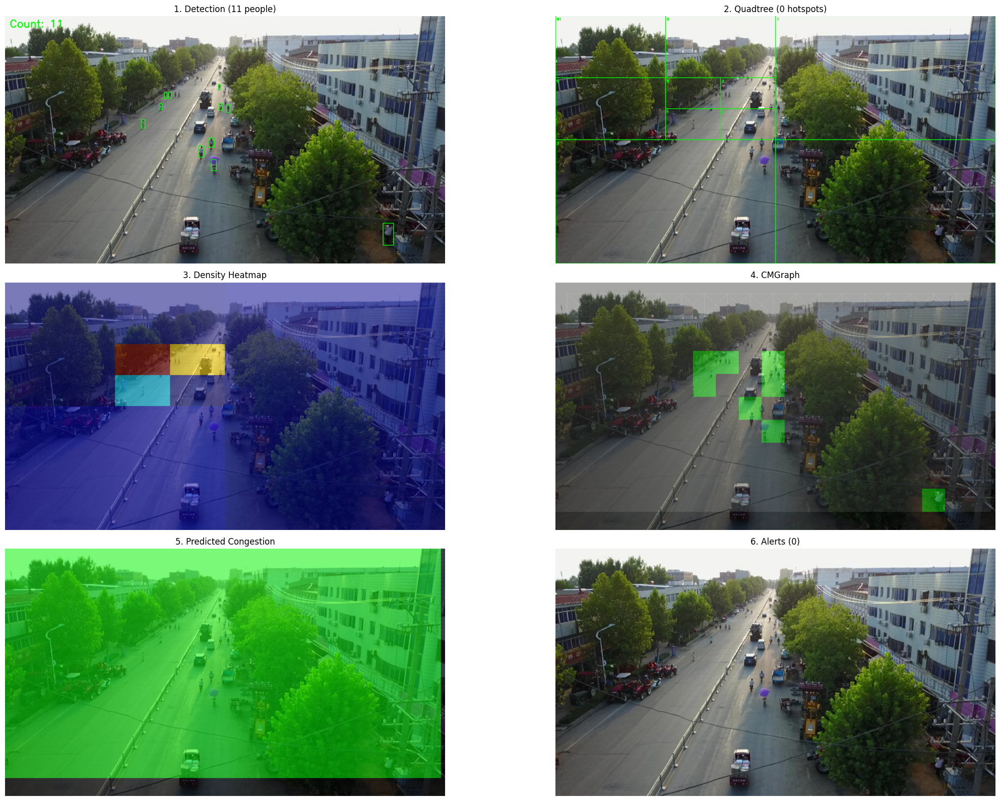

In [ ]:
pcms = ProactiveCrowdManagementSystem(model, frame_width=1920, frame_height=1080)

val_list = [f for f in os.listdir(val_dir) if f.lower().endswith('.jpg')]
val_sample = random.sample(val_list, min(10, len(val_list)))

print("Processing frames to build temporal history...")
for i, img_name in enumerate(val_sample):
    img_path = os.path.join(val_dir, img_name)
    frame = cv2.imread(img_path)
    if frame is None:
        continue
    if frame.shape[1] != 1920 or frame.shape[0] != 1080:
        frame = cv2.resize(frame, (1920, 1080))
    results = pcms.process_frame(frame)
    print(f"  Frame {i+1}: {results['crowd_count']} people, {len(results['hotspots'])} hotspots, {len(results['alerts'])} alerts")

print("\n✓ Temporal history built!")
print("\nSystem Statistics:")
for key, value in pcms.get_statistics().items():
    print(f"  {key}: {value}")

test_frame_path = os.path.join(val_dir, random.choice(val_list))
test_frame = cv2.imread(test_frame_path)
test_frame = cv2.resize(test_frame, (1920, 1080))

results = pcms.process_frame(test_frame)
vis_results = pcms.visualize_results(test_frame, results)

fig = plt.figure(figsize=(24, 16))
for key in vis_results:
    vis_results[key] = cv2.cvtColor(vis_results[key], cv2.COLOR_BGR2RGB)

plt.subplot(3, 2, 1); plt.imshow(vis_results['detection']); plt.title(f"1. Detection ({results['crowd_count']} people)"); plt.axis('off')
plt.subplot(3, 2, 2); plt.imshow(vis_results['quadtree']); plt.title(f"2. Quadtree ({len(results['hotspots'])} hotspots)"); plt.axis('off')
plt.subplot(3, 2, 3); plt.imshow(vis_results['density']); plt.title('3. Density Heatmap'); plt.axis('off')
plt.subplot(3, 2, 4); plt.imshow(vis_results['graph']); plt.title('4. CMGraph'); plt.axis('off')
plt.subplot(3, 2, 5); plt.imshow(vis_results['prediction']); plt.title('5. Predicted Congestion'); plt.axis('off')
plt.subplot(3, 2, 6); plt.imshow(vis_results['alerts']); plt.title(f"6. Alerts ({len(results['alerts'])})"); plt.axis('off')
plt.tight_layout(); plt.show()